In [307]:
import librosa
import IPython
import numpy as np

from matplotlib import pyplot as plt
from sklearn.decomposition import NMF

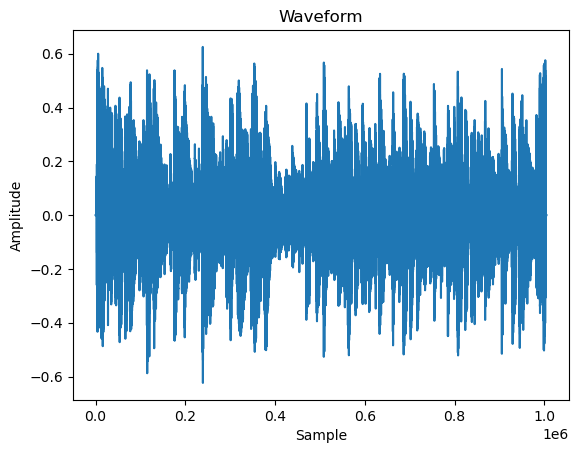

In [308]:
# Load the audio mp3 sample from librosa
x, sr = librosa.load('audio.mp3', sr=None, mono=True)

# plot the waveform
plt.plot(x)
plt.title('Waveform')
plt.xlabel('Sample')
plt.ylabel('Amplitude')
plt.show()

In [309]:
# play the audio sample with IPython
IPython.display.Audio(data=x, rate=sr)

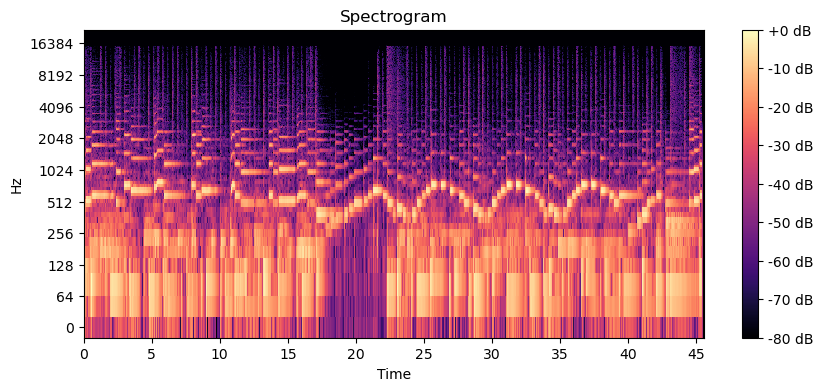

In [310]:
# Convert into spectrogram
stft = librosa.stft(x, n_fft=1024)

amp = np.abs(stft)
phase = np.angle(stft)

# plot the spectrogram with librosa
plt.figure(figsize=(10, 4))
librosa.display.specshow(librosa.amplitude_to_db(amp, ref=np.max), y_axis='log', x_axis='time', sr=sr)
plt.colorbar(format='%+2.0f dB')
plt.title('Spectrogram')
plt.show()

In [ ]:
n_components = 30
# decompose the spectrogram
nmf = NMF(n_components=n_components, init='random', random_state=0, max_iter=5000, solver='mu', beta_loss='kullback-leibler')
W = nmf.fit_transform(amp)
H = nmf.components_


In [ ]:
# reconstruct and get the error
reconstructed = np.dot(W, H)
error = np.mean((amp - reconstructed)**2)
print(f'Error: {error}')

Error: 0.0866556391119957


In [ ]:
# play reconstructed audio
reconstructed_stft = reconstructed * np.exp(1j * phase)
reconstructed_audio = librosa.istft(reconstructed_stft)
IPython.display.Audio(data=reconstructed_audio, rate=sr)

In [ ]:
# reconstruct audio for each component
reconstructed = []
for i in range(n_components):
    # reconstruct the spectrogram
    amp_reconstructed = W[:, i].reshape(-1, 1) @ H[i, :].reshape(1, -1)
    # reconstruct the signal
    stft_reconstructed = amp_reconstructed * np.exp(1j * phase)
    
    # inverse the stft with librosa
    x_reconstructed = librosa.istft(stft_reconstructed)
    reconstructed.append(x_reconstructed)


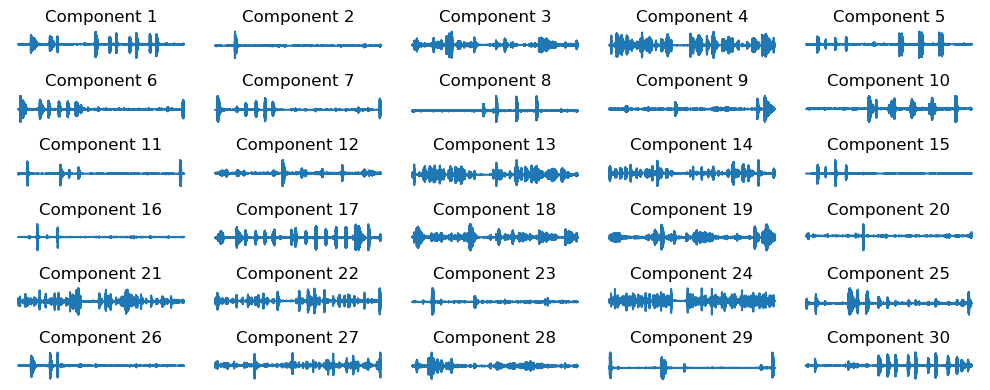

In [ ]:
# plot the components
plt.figure(figsize=(10, 4))
for i in range(n_components):
    plt.subplot(6, 5, i + 1)
    plt.plot(reconstructed[i])
    plt.title(f'Component {i + 1}')
    plt.axis('off')
plt.tight_layout()
plt.show()

In [ ]:
# play an example component
IPython.display.Audio(data=reconstructed[8], rate=sr)

In [ ]:
combinations = {
    'Saxophone': [0, 6, 9, 14, 16, 18, 26],
    'Piano': [4, 3, 5, 8, 11, 19, 20, 25, 27],
    'Guitar': [1, 10, 12, 13, 17],
    'Bass': [2, 7, 22, 24, 29],
    'Drums': [15, 23]
}

for instrument, combination in combinations.items():
    comb = np.sum([reconstructed[j] for j in combination], axis=0)
    print(f'{instrument}: {combination}')
    IPython.display.display(IPython.display.Audio(data=comb, rate=sr))


Saxophone: [0, 6, 9, 14, 16, 18, 26]


Piano: [4, 3, 5, 8, 11, 19, 20, 25, 27]


Guitar: [1, 10, 12, 13, 17]


Bass: [2, 7, 22, 24, 29]


Drums: [15, 23]


In [ ]:
reconstructed_hpss = [librosa.effects.hpss(x)[0] for x in reconstructed]

In [ ]:
# cluster reconstructed audio
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA

# get the features
mfcc_features = np.array([librosa.feature.mfcc(y=x, sr=sr, n_mfcc=20) for x in reconstructed_hpss])
mfcc_features = mfcc_features.reshape(mfcc_features.shape[0], -1)


# reduce the features
pca = PCA(n_components=20, random_state=5)
mfcc_pca = pca.fit_transform(mfcc_features)

# cluster the features
n_clusters = 5
aglo = KMeans(n_clusters=n_clusters, random_state=5)
labels = aglo.fit_predict(mfcc_pca)

combinations_cl = []
for i in range(n_clusters):
    combinations_cl.append(np.where(labels == i)[0])

combined = [np.zeros_like(reconstructed[0]) for _ in range(n_clusters)]
for i, label in enumerate(labels):
    combined[label] += reconstructed[i]

# play the combined audio
for i in range(n_clusters):
    IPython.display.display(IPython.display.Audio(data=combined[i], rate=sr))

In [ ]:
# Define the Jaccard similarity function
def jaccard_similarity(list1, list2):
    set1, set2 = set(list1), set(list2)
    intersection = len(set1 & set2)
    union = len(set1 | set2)
    return intersection / union if union != 0 else 0

# print the combinations vs combinations_cl
jaccs = []
for instrument, combination in combinations.items():
    print(instrument)
    print(f'- Manual: {combination}')
    # print the most similar combination_cl
    hits = 0
    best = i
    for i, comb_cl in enumerate(combinations_cl):
        hit = len(set(comb_cl) & set(combination))
        if hit > hits:
            hits = hit
            best = i
    jacc = jaccard_similarity(combination, combinations_cl[best])
    jaccs.append(jacc)
    print(f'- Clustering: {list(combinations_cl[best])}', f'Jaccard: {jacc}')
    print('')

# average jazzard similarity
print(f'Average Jaccard: {np.mean(jaccs)}')


Saxophone
- Manual: [0, 6, 9, 14, 16, 18, 26]
- Clustering: [0, 4, 5, 6, 7, 9, 15, 16, 22, 28, 29] Jaccard: 0.2857142857142857

Piano
- Manual: [4, 3, 5, 8, 11, 19, 20, 25, 27]
- Clustering: [2, 8, 11, 17, 18, 27] Jaccard: 0.25

Guitar
- Manual: [1, 10, 12, 13, 17]
- Clustering: [1, 10, 14, 19, 24, 25, 26] Jaccard: 0.2

Bass
- Manual: [2, 7, 22, 24, 29]
- Clustering: [0, 4, 5, 6, 7, 9, 15, 16, 22, 28, 29] Jaccard: 0.23076923076923078

Drums
- Manual: [15, 23]
- Clustering: [0, 4, 5, 6, 7, 9, 15, 16, 22, 28, 29] Jaccard: 0.08333333333333333

Average Jaccard: 0.20996336996336998
